In [1]:
! pip install torch torchvision

# Important Library

In [2]:
# Standard library imports
import os  # For handling file paths
import random  # For generating random numbers
from collections import Counter  # For counting hashable objects

# Third-party imports
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
from PIL import Image, ImageDraw  # For image handling and drawing
import matplotlib.pyplot as plt  # For plotting
from sklearn.model_selection import train_test_split  # For splitting data into training and testing sets

# PyTorch imports
import torch  # For tensor operations and neural networks
import torchvision  # For computer vision tasks

# Torchvision imports
from torchvision import transforms as T  # For data transformations
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor  # For Faster R-CNN model


In [3]:
train = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")
train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [4]:
coord = pd.DataFrame(list(train.bbox.apply(lambda x: x[1:-1].split(",")).values), columns=["x1", "y1", "w", "h"])

In [5]:
df = pd.concat([train,coord], axis=1)

### make the value of the columns numeric values

In [6]:
df

,image_id,width,height,bbox,source,x1,y1,w,h
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0


In [7]:
df['x1']=pd.to_numeric(df['x1'])
df['y1']=pd.to_numeric(df['y1'])
df['w']=pd.to_numeric(df['w'])
df['h']=pd.to_numeric(df['h'])

### calculating x2, y2

In [8]:
df['x2']=df['x1']+df['w']
df['y2']=df['y1']+df['h']

In [9]:
df

,image_id,width,height,bbox,source,x1,y1,w,h,x2,y2
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,150.0,261.0
...,...,...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0,148.0,714.0
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0,399.0,631.0
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0,275.0,299.0
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0,614.0,92.0


### drop unnecessary columns

In [10]:
df.drop(['bbox', 'width', 'height', 'w', 'h', 'source'], axis =1, inplace=True)

In [12]:
df.head()

,image_id,x1,y1,x2,y2
0,b6ab77fd7,834.0,222.0,890.0,258.0
1,b6ab77fd7,226.0,548.0,356.0,606.0
2,b6ab77fd7,377.0,504.0,451.0,664.0
3,b6ab77fd7,834.0,95.0,943.0,202.0
4,b6ab77fd7,26.0,144.0,150.0,261.0


#### taking unique ids of the image

In [19]:
unique_imgs = df.image_id.unique()
unique_imgs

array(['b6ab77fd7', 'b53afdf5c', '7b72ea0fb', ..., 'a5c8d5f5c',
       'e6b5e296d', '5e0747034'], dtype=object)

#### making custom class for perparing data

In [49]:
# defining a custom dataset class inheriting from torch.utils.data.Dataset

class custData(torch.utils.data.Dataset):
    def __init__(self, df, unique_imgs, indices):
        """
        Initialize the dataset with a DataFrame, a list of unique image names, and indices.
        
        Args:
            df (pd.DataFrame): DataFrame containing image IDs and bounding box information.
            unique_imgs (list): List of unique image names.
            indices (list): List of indices to be used for accessing the dataset.
        """
        self.df = df
        self.unique_imgs = unique_imgs
        self.indices = indices   # Indices for creating the images in the dataset
        
    def __len__(self):
        """
        eturn the length of the dataset.
        
        Returns:
            int: Number of samples in the dataset.
        """
        return len(self.indices)
    
    def __getitem__(self, idx):
        """
        Get an item from the dataset at the specified index.
        
        Args:
            idx (int): Index of the item to be fetched.
        
        Returns:
            tuple: Tuple containing the image tensor and the target dictionary.
        """
        # get the image name using the index
        image_name = self.unique_imgs[self.indices[idx]]
        
        # get the bounding box for the images
        boxes = self.df[self.df.image_id == image_name].values[:,1:].astype("float")
        
        #opening the image and converting it to RGB format
        img = Image.open("../input/global-wheat-detection/train/" + image_name + ".jpg").convert("RGB")
        
        #create label tensors with value 1 for each bounding box 
        labels = torch.ones(boxes.shape[0], dtype= torch.int64)
        
        # creating the target dictionary containing boxes and labels
        target = {}
        target["boxes"] = torch.tensor(boxes)
        target['label'] = labels
        
        #return the image converted to a tensor and the target dictionary
        return T.ToTensor()(img), target

### splitting the data into train and validation

In [50]:
train_inds, val_inds = train_test_split(range(unique_imgs.shape[0]), test_size=0.1)

In [51]:
def custom_collate(data):
    return data

Need for custom_collate in Object Detection
Handling Variable Number of Annotations:

In object detection, each image can have a different number of objects, and consequently, a different number of annotations (bounding boxes). The default collate function in PyTorch (default_collate) expects each sample in the batch to have the same shape, which is not the case here.
Maintaining Data Structure:

The custom_collate function helps maintain the structure of the data when it is batched together. Specifically, it returns the data as a list of tuples, where each tuple contains an image tensor and its corresponding target dictionary. This structure is essential for the Faster R-CNN model, which expects a list of such tuples as input.
Avoiding Collate Errors:

Without a custom collate function, the DataLoader might try to convert the list of dictionaries (targets) into a single tensor, which would fail due to the variable number of bounding boxes per image.

Input: data is a list of tuples. Each tuple contains:

An image tensor (e.g., T.ToTensor()(img)).
A target dictionary (e.g., target with keys "boxes" and "labels").
Output: The same list of tuples is returned without any modification.

# Call the data loader to prepare it to the model:

In [52]:
train_dl = torch.utils.data.DataLoader(custData(df, unique_imgs, train_inds),
                                      batch_size=16,
                                      shuffle= True,
                                      collate_fn = custom_collate,
                                      pin_memory = True if torch.cuda.is_available() else False)
test_dl = torch.utils.data.DataLoader(custData(df, unique_imgs, val_inds),
                                      batch_size=16,
                                      shuffle= True,
                                      collate_fn = custom_collate,
                                      pin_memory = True if torch.cuda.is_available() else False)

# Modelling

In [53]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=True)

In [54]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [55]:
num_classes =2

In [56]:
# updating the out_features on the model according to our need

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [57]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [58]:
device

device(type='cuda')

In [59]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum = 0.9, weight_decay = 0.005)
num_epochs = 5

#### training the model and observing loss

In [60]:
# moving the model to the specified device 
model.to(device)

# looping over the number of epochs
for epoch in range(num_epochs):
    epoch_loss = 0 # initializing the loss for current epoch
    
    # looping over the data in the training dataloader
    for data in train_dl:
        imgs = []
        targets = []
        
        # looping over each data sample in batch
        for d in data:
            # append the image tensor to the imgs list and move it to the device
            imgs.append(d[0].to(device))
            
            # create a target dictionary for the current sample
            targ = {}
            # moving the bounding boxes tensor to the device
            targ['boxes'] = d[1]['boxes'].to(device)
            # moving the label tensor to the device
            targ['labels'] = d[1]['label'].to(device)
            
            # append the target dictionary to the target list
            targets.append(targ)
            
        # perform a forward pass through the model and get the loss dictionary
        loss_dict = model(imgs, targets)
        
        # sum all the losses in the loss dictionary to get the total loss
        loss = sum(v for v in loss_dict.values())
        
        # add the loss for the current batch to the epoch loss and convert it to the numpy value
        epoch_loss += loss.cpu().detach().numpy()
        
        # zero the gradients of the optimizer
        optimizer.zero_grad()
        
        # Backpropagate the loss
        loss.backward()
        
        # update the model parameters
        optimizer.step()
        
    # print the total loss for the current epoch
    print(epoch_loss)

217.97404934680404
168.43216539846807
160.50933649854107
155.71999058024755
152.62929703158628


evaluate model

In [62]:
model.eval()
data = iter(test_dl).__next__()

In [63]:
img= data[0][0]
boxes=data[0][1]['boxes']
labels=data[0][1]['label']

In [64]:
output = model([img.to(device)])

- output os the evaluation:

In [65]:
output

[{'boxes': tensor([[ 850.9697,   10.9821,  948.2360,  101.8988],
          [ 905.4830,  801.6480, 1020.5980,  867.4772],
          [ 828.8132,  654.2489,  936.2883,  737.5255],
          [ 654.9341,  793.2464,  752.0499,  870.7554],
          [ 760.7963,  753.7931,  856.6600,  840.9457],
          [ 946.8416,   87.8474, 1024.0000,  178.9782],
          [ 878.3678,  745.2733, 1024.0000,  807.4797],
          [ 725.2064,  955.5352,  807.7098, 1024.0000],
          [ 892.7944,  348.0860,  999.2318,  433.8912],
          [ 766.0642,   20.6658,  853.2844,   98.4431],
          [   0.0000,  658.8627,   95.5002,  717.6213],
          [ 747.3011,  151.7423,  855.0681,  222.2146],
          [ 656.8171,  875.5436,  783.1193,  932.0240],
          [ 739.1949,   92.8279,  806.3971,  175.7247],
          [ 834.0336,  382.1338,  928.5798,  448.8875],
          [ 963.5120,  161.1869, 1024.0000,  225.3150],
          [ 946.1229,  448.2351, 1024.0000,  514.8351],
          [ 974.1471,  257.4830, 1024.0

In [66]:
out_bbox=output[0]['boxes']
out_scores=output[0]['scores']

In [67]:
keep = torchvision.ops.nms(out_bbox,out_scores,0.45)

In [68]:
out_bbox.shape , keep.shape

(torch.Size([32, 4]), torch.Size([28]))

- prediction detection:

In [69]:
im = (img.permute(1,2,0).cpu().detach().numpy()*255).astype('uint8')
im

array([[[33, 47,  0],
        [34, 48,  0],
        [33, 47,  0],
        ...,
        [40, 59, 29],
        [33, 52, 24],
        [26, 45, 17]],

       [[45, 59,  8],
        [46, 60,  9],
        [45, 59,  8],
        ...,
        [40, 59, 31],
        [34, 53, 25],
        [28, 47, 19]],

       [[72, 85, 32],
        [74, 87, 33],
        [73, 86, 32],
        ...,
        [36, 55, 27],
        [32, 50, 24],
        [26, 44, 18]],

       ...,

       [[19, 10,  3],
        [22, 13,  6],
        [19, 10,  3],
        ...,
        [47, 53, 41],
        [44, 50, 38],
        [41, 47, 35]],

       [[26, 17, 10],
        [26, 17, 10],
        [21, 12,  5],
        ...,
        [45, 51, 39],
        [42, 48, 36],
        [40, 46, 34]],

       [[28, 19, 12],
        [27, 18, 11],
        [21, 12,  5],
        ...,
        [44, 50, 38],
        [43, 49, 37],
        [42, 48, 36]]], dtype=uint8)

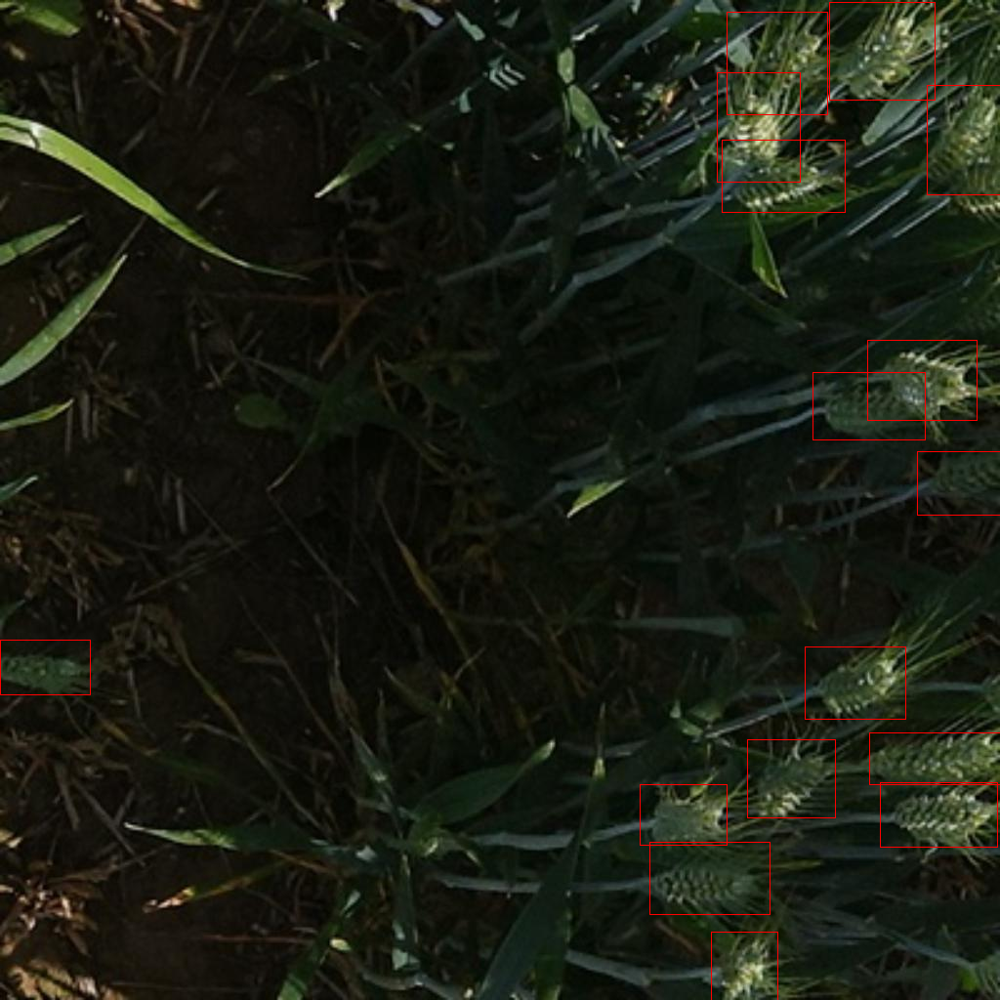

In [70]:
vsample = Image.fromarray(im)
draw = ImageDraw.Draw(vsample)
for box in boxes :
    draw.rectangle(list(box),fill=None,outline='red')
vsample

In [71]:
# Save the model state
torch.save(model.state_dict(), 'modified_fasterrcnn_resnet50_fpn.pth')

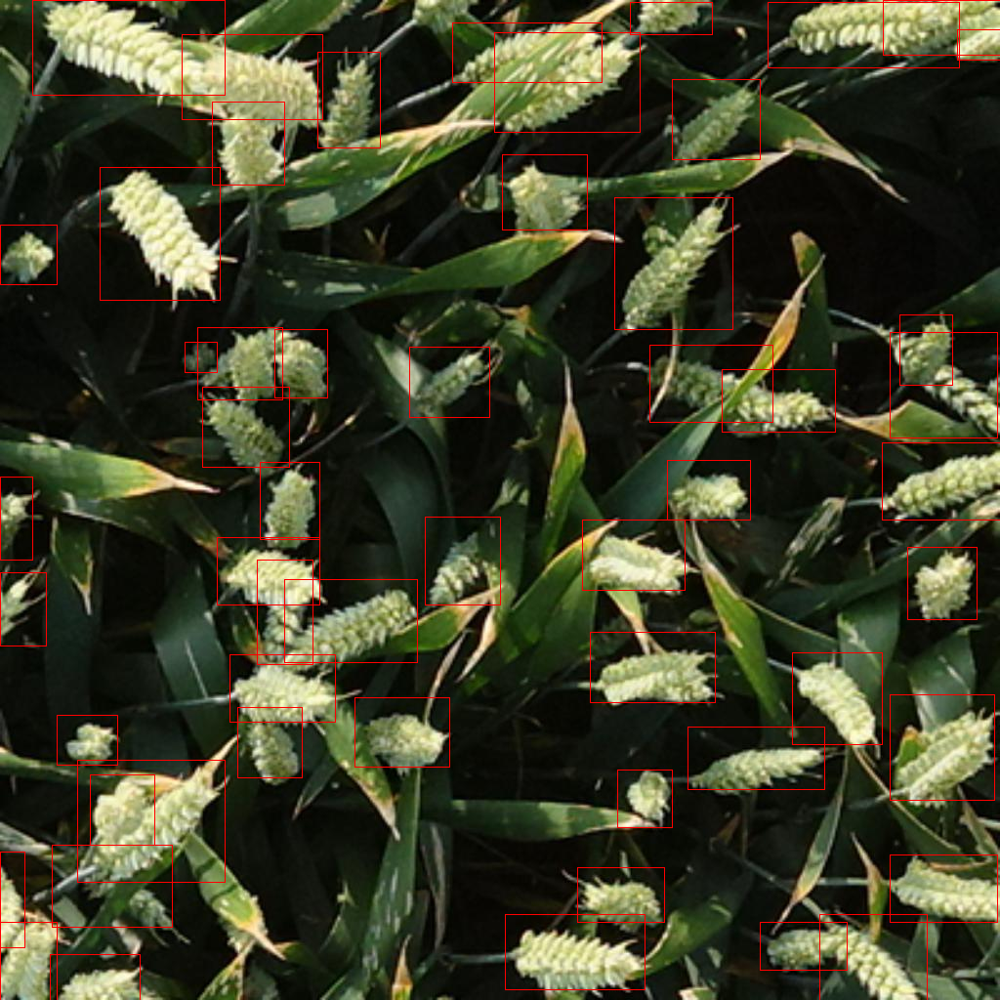

In [73]:
model.eval()
data = iter(test_dl).__next__()

img= data[0][0]
boxes=data[0][1]['boxes']
labels=data[0][1]['label']

output = model([img.to(device)])

out_bbox=output[0]['boxes']
out_scores=output[0]['scores']

keep = torchvision.ops.nms(out_bbox,out_scores,0.45)

out_bbox.shape , keep.shape
im = (img.permute(1,2,0).cpu().detach().numpy()*255).astype('uint8')

vsample = Image.fromarray(im)
draw = ImageDraw.Draw(vsample)
for box in boxes :
    draw.rectangle(list(box),fill=None,outline='red')
vsample

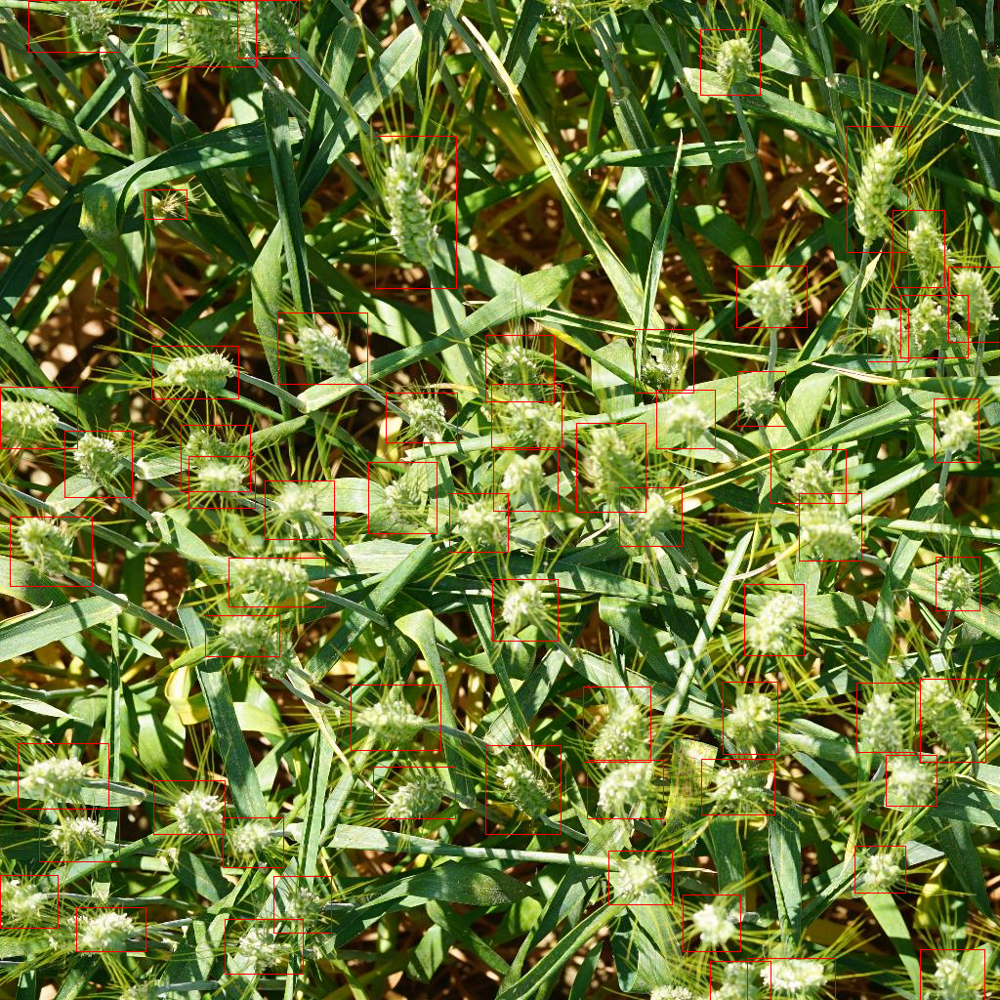

In [74]:
model.eval()
data = iter(test_dl).__next__()

img= data[0][0]
boxes=data[0][1]['boxes']
labels=data[0][1]['label']

output = model([img.to(device)])

out_bbox=output[0]['boxes']
out_scores=output[0]['scores']

keep = torchvision.ops.nms(out_bbox,out_scores,0.45)

out_bbox.shape , keep.shape
im = (img.permute(1,2,0).cpu().detach().numpy()*255).astype('uint8')

vsample = Image.fromarray(im)
draw = ImageDraw.Draw(vsample)
for box in boxes :
    draw.rectangle(list(box),fill=None,outline='red')
vsample

# Load the saved model

In [75]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Function to create the model and replace the classifier head
def create_model(num_classes):
    # Load a pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=False)
    
    # Get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    
    # Replace the pre-trained head with a new one (adjusting for the number of classes)
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model

# Specify the number of classes (1 class + background)
num_classes = 2

# Create a model instance
model2 = create_model(num_classes)

# Load the saved model state dictionary
model2.load_state_dict(torch.load('/kaggle/working/modified_fasterrcnn_resnet50_fpn.pth'))

# Move the model to the specified device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model2.to(device)

# Now the model is ready to be used for inference or further training

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 197MB/s] 
/tmp/ipykernel_30/3920936157.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during un

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

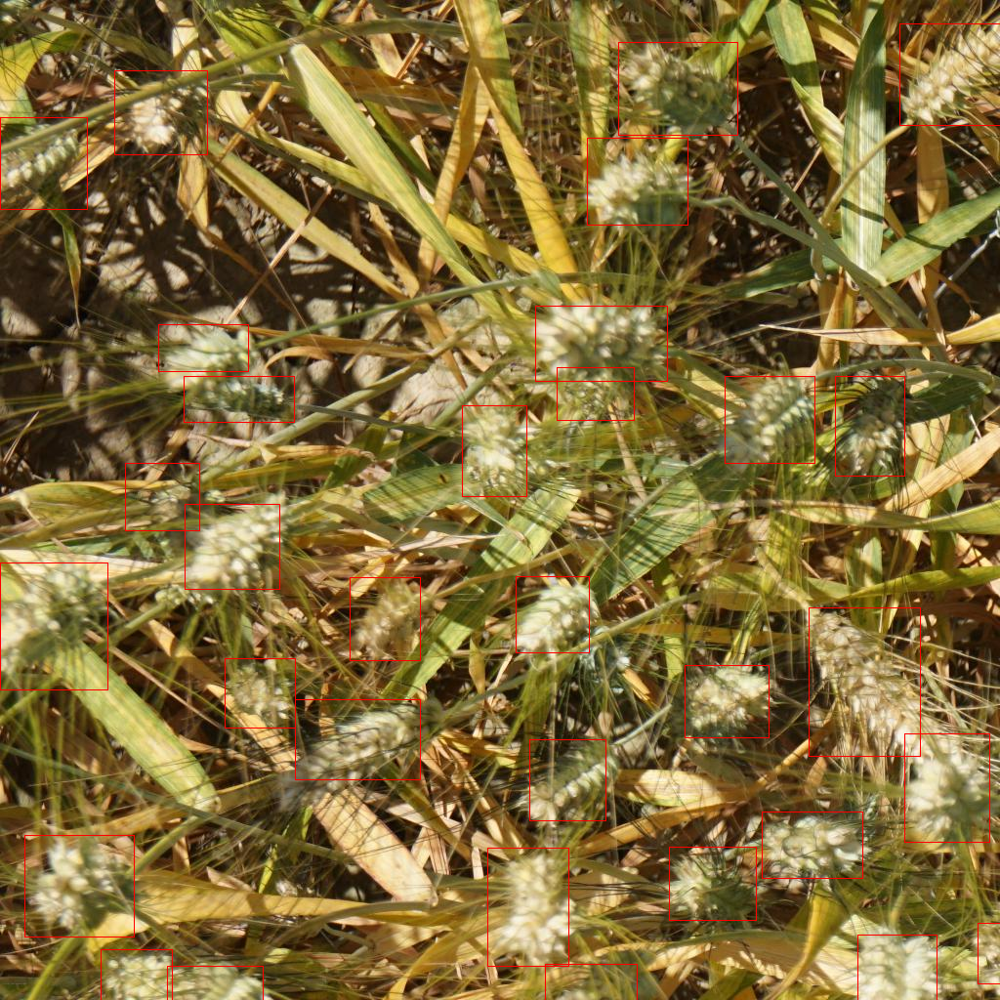

In [76]:
model2.eval()
data = iter(test_dl).__next__()

img= data[0][0]
boxes=data[0][1]['boxes']
labels=data[0][1]['label']

output = model([img.to(device)])

out_bbox=output[0]['boxes']
out_scores=output[0]['scores']

keep = torchvision.ops.nms(out_bbox,out_scores,0.45)

out_bbox.shape , keep.shape
im = (img.permute(1,2,0).cpu().detach().numpy()*255).astype('uint8')

vsample = Image.fromarray(im)
draw = ImageDraw.Draw(vsample)
for box in boxes :
    draw.rectangle(list(box),fill=None,outline='red')
vsample